In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
df = pd.read_csv('hour.csv')
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [3]:
print(df.info(),'\n')
print(df.describe())
df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB
None 

          instant        season           

(17379, 17)

In [4]:
df.rename(columns={'instant':'rec_id',
                        'dteday':'datetime',
                        'holiday':'is_holiday',
                        'workingday':'is_workingday',
                        'weathersit':'weather_condition',
                        'hum':'humidity',
                        'mnth':'month',
                        'cnt':'total_count',
                        'hr':'hour',
                        'yr':'year'},inplace=True) 

In [5]:
df.head()

,rec_id,datetime,season,year,month,hour,is_holiday,weekday,is_workingday,weather_condition,temp,atemp,humidity,windspeed,casual,registered,total_count
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [6]:
### convertion of datatype


# datetime 
df.datetime = pd.to_datetime(df.datetime)

#categorical
df['season'] = df.season.astype('category')
df['is_holiday'] = df.is_holiday.astype('category')
df['weekday'] = df.weekday.astype('category')
df['weather_condition'] = df.weather_condition.astype('category')
df['is_workingday'] = df.is_workingday.astype('category')
df['month'] = df.month.astype('category') 
df['year'] = df.year.astype('category')
df['hour'] = df.hour.astype('category')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   rec_id             17379 non-null  int64         
 1   datetime           17379 non-null  datetime64[ns]
 2   season             17379 non-null  category      
 3   year               17379 non-null  category      
 4   month              17379 non-null  category      
 5   hour               17379 non-null  category      
 6   is_holiday         17379 non-null  category      
 7   weekday            17379 non-null  category      
 8   is_workingday      17379 non-null  category      
 9   weather_condition  17379 non-null  category      
 10  temp               17379 non-null  float64       
 11  atemp              17379 non-null  float64       
 12  humidity           17379 non-null  float64       
 13  windspeed          17379 non-null  float64       
 14  casual

In [8]:
season_cat = {1:'winter', 2:'spring', 3:'summer', 4:'fall'}
df['season'] = df['season'].map(season_cat)

<AxesSubplot:xlabel='hour', ylabel='total_count'>

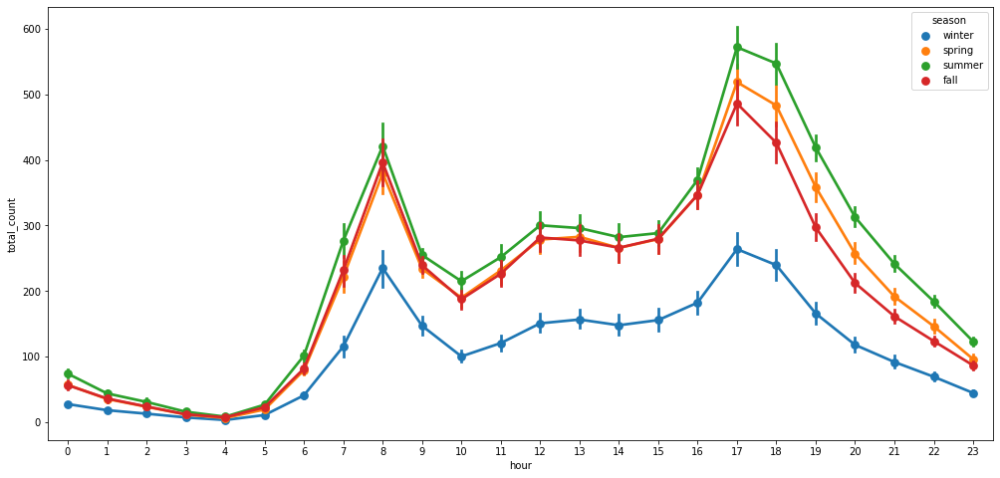

In [9]:
# A point plot represents an estimate of central tendency for a numeric variable by the position
# of scatter plot points and provides some indication of the uncertainty around that estimate using error bars.

# Point plots can be more useful than bar plots for focusing comparisons between different levels of 
# one or more categorical variables. They are particularly adept at showing interactions: 
# how the relationship between levels of one categorical variable changes across levels of a
# second categorical variable. The lines that join each point from the same hue level allow interactions
# to be judged by differences in slope, which is easier for the eyes than comparing the heights of several groups
# of points or bars.

plt.figure(figsize=(17,8))
sns.pointplot(data = df[['season','hour','total_count']],x='hour',y='total_count',hue='season')

<AxesSubplot:xlabel='hour', ylabel='total_count'>

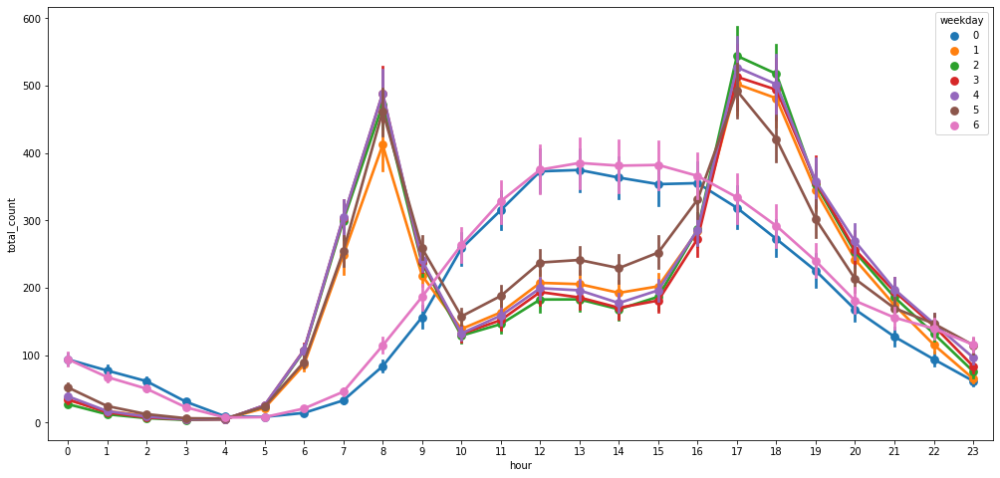

In [10]:
plt.figure(figsize=(17,8))
sns.pointplot(data = df[['weekday','hour','total_count']],x='hour',y='total_count',hue='weekday')

<AxesSubplot:xlabel='month', ylabel='total_count'>

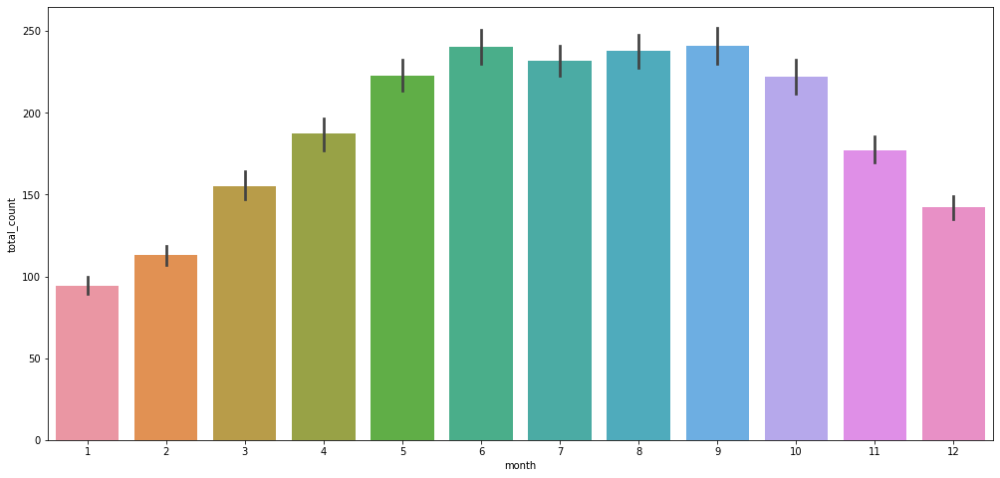

In [11]:
plt.figure(figsize=(17,8))
sns.barplot(data = df[['month','total_count']],x='month',y='total_count')

In [12]:
print(df.columns)
df.head()

Index(['rec_id', 'datetime', 'season', 'year', 'month', 'hour', 'is_holiday',
       'weekday', 'is_workingday', 'weather_condition', 'temp', 'atemp',
       'humidity', 'windspeed', 'casual', 'registered', 'total_count'],
      dtype='object')


,rec_id,datetime,season,year,month,hour,is_holiday,weekday,is_workingday,weather_condition,temp,atemp,humidity,windspeed,casual,registered,total_count
0,1,2011-01-01,winter,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,winter,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,winter,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,winter,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,winter,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


<AxesSubplot:>

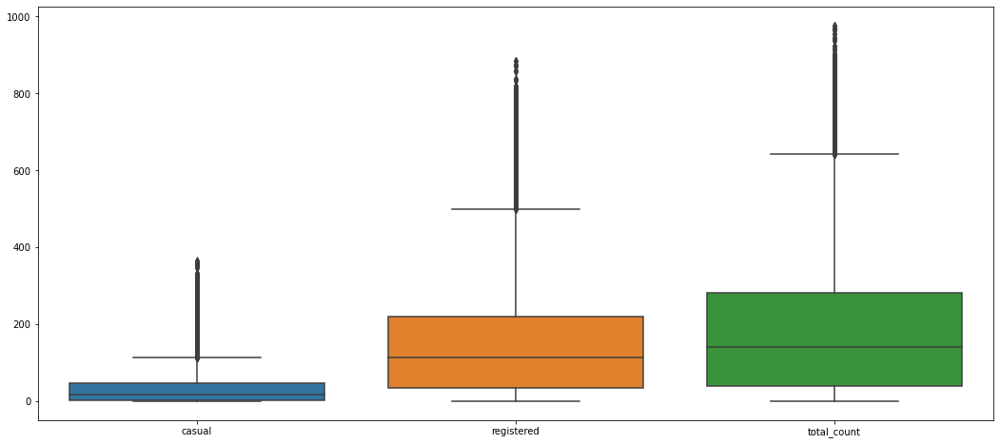

In [13]:
plt.figure(figsize=(18,8))
sns.boxplot(data=df[['casual', 'registered', 'total_count']])

<AxesSubplot:>

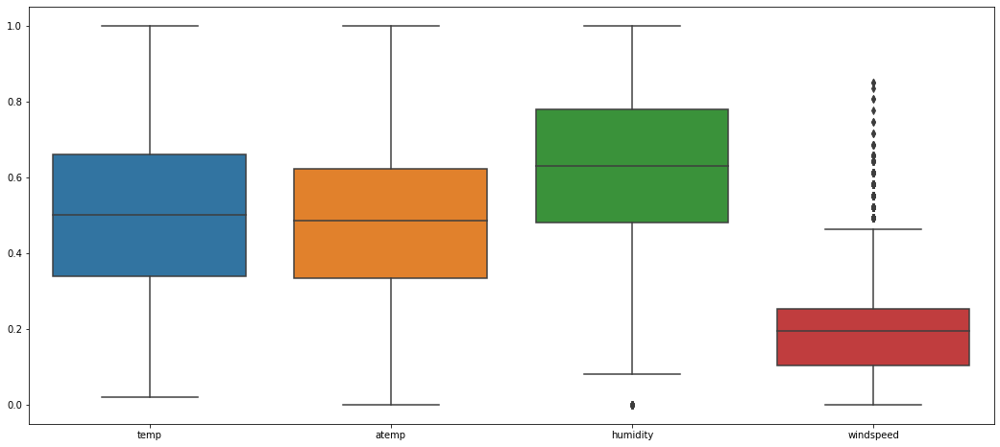

In [14]:
plt.figure(figsize=(18,8))
sns.boxplot(data=df[['temp','atemp','humidity', 'windspeed']])

<AxesSubplot:xlabel='year', ylabel='total_count'>

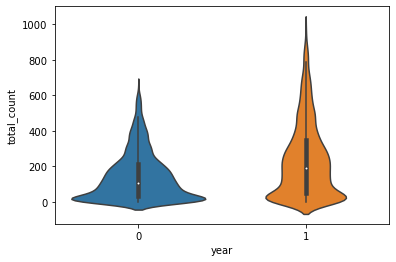

In [15]:
sns.violinplot(data=df[['year','total_count']],x='year',y='total_count')

In [16]:
df.isnull().sum()

rec_id               0
datetime             0
season               0
year                 0
month                0
hour                 0
is_holiday           0
weekday              0
is_workingday        0
weather_condition    0
temp                 0
atemp                0
humidity             0
windspeed            0
casual               0
registered           0
total_count          0
dtype: int64

<AxesSubplot:>

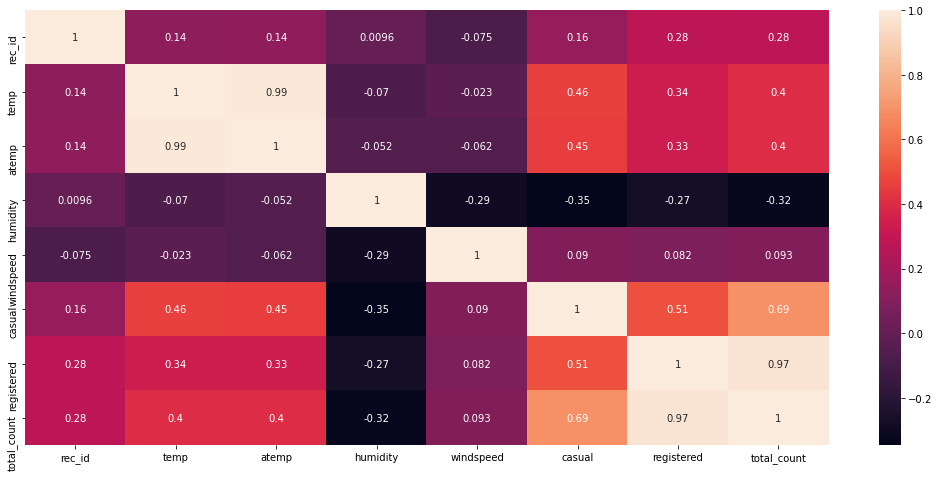

In [17]:
plt.figure(figsize=(18,8))
sns.heatmap(df.corr(),annot=True)

In [18]:
df.describe().columns

Index(['rec_id', 'temp', 'atemp', 'humidity', 'windspeed', 'casual',
       'registered', 'total_count'],
      dtype='object')

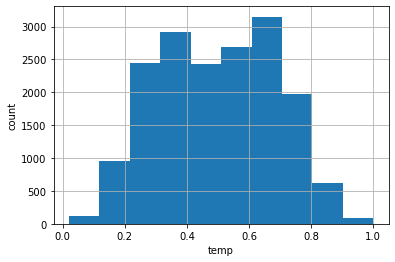

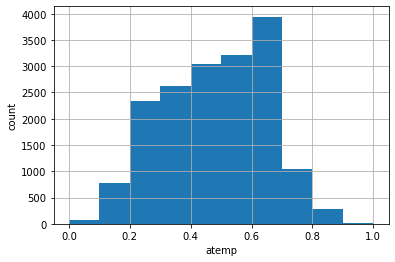

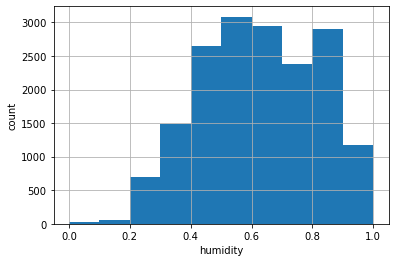

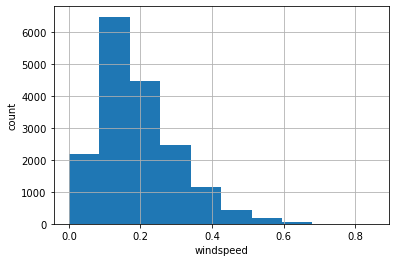

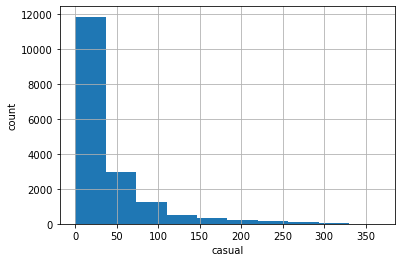

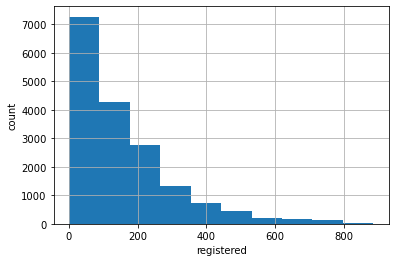

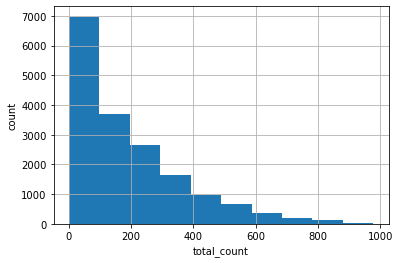

In [19]:
df_new = df[['temp', 'atemp', 'humidity', 'windspeed', 'casual','registered', 'total_count']]

for variable in df_new.columns:
    df[variable].hist()
    plt.xlabel(variable)
    plt.ylabel('count')
    plt.show()

# df.temp.hist(bins=50)

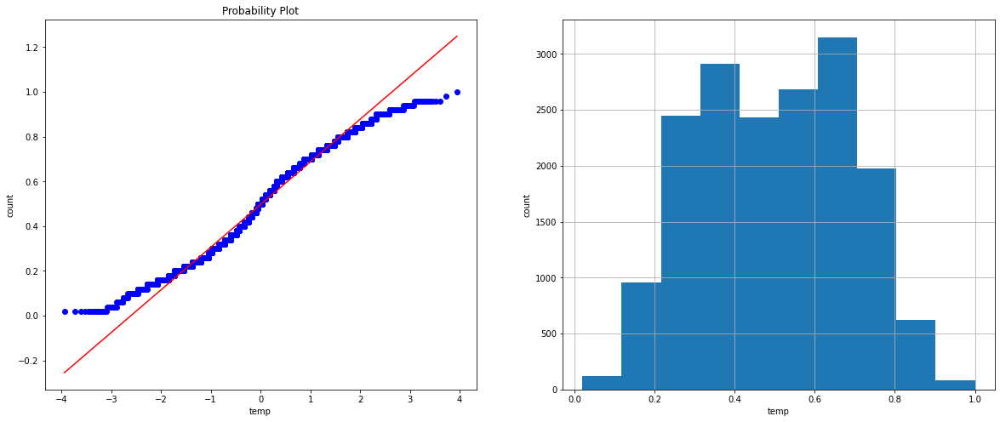

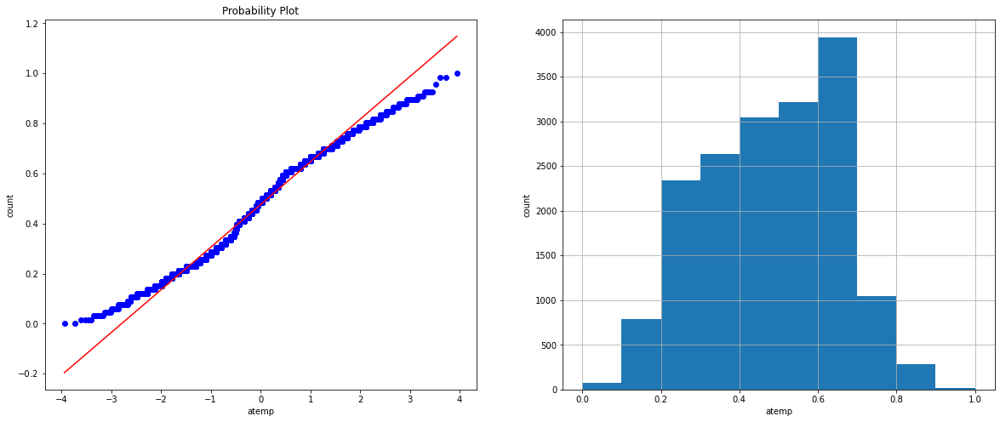

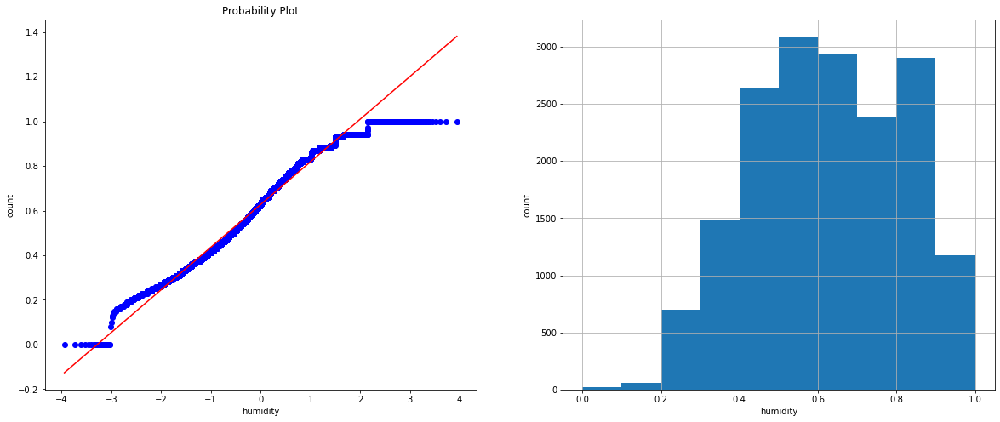

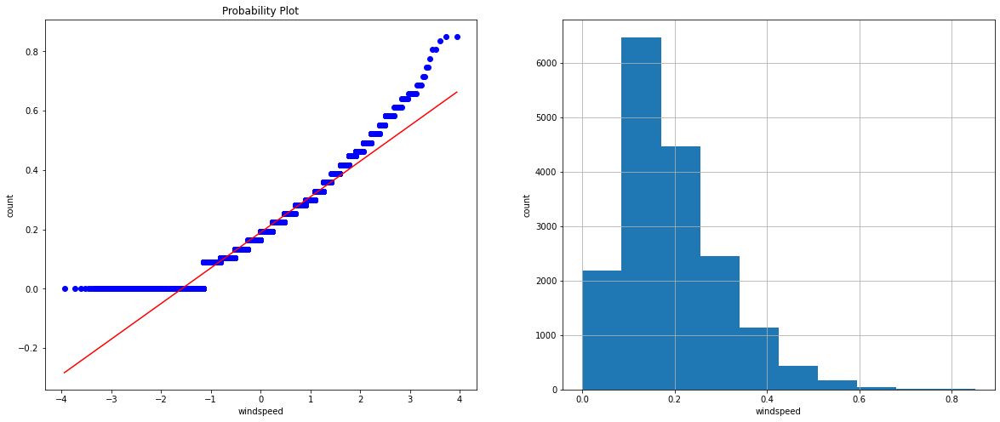

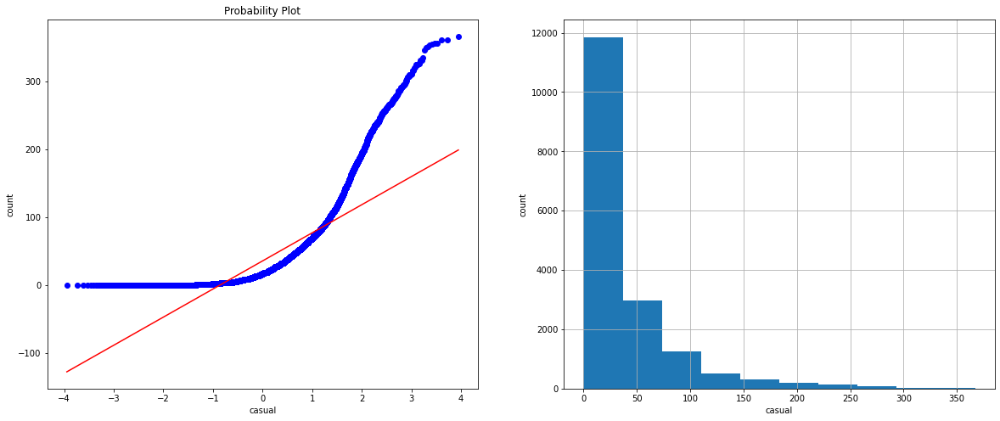

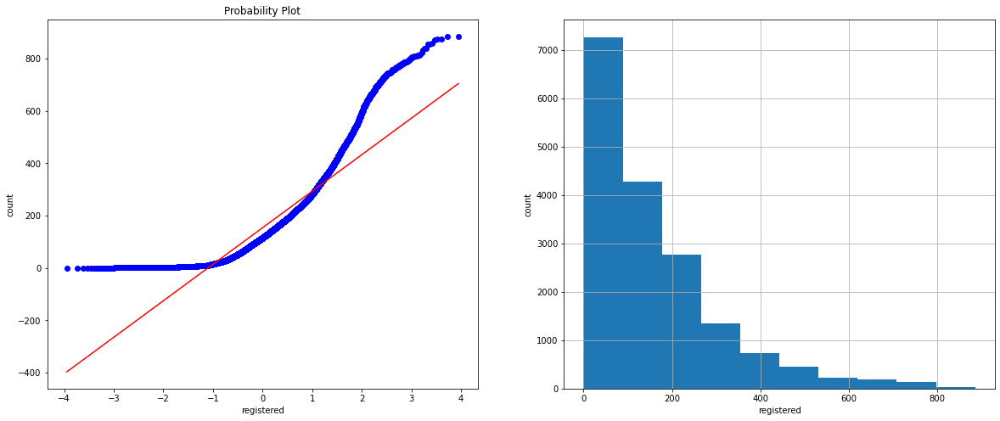

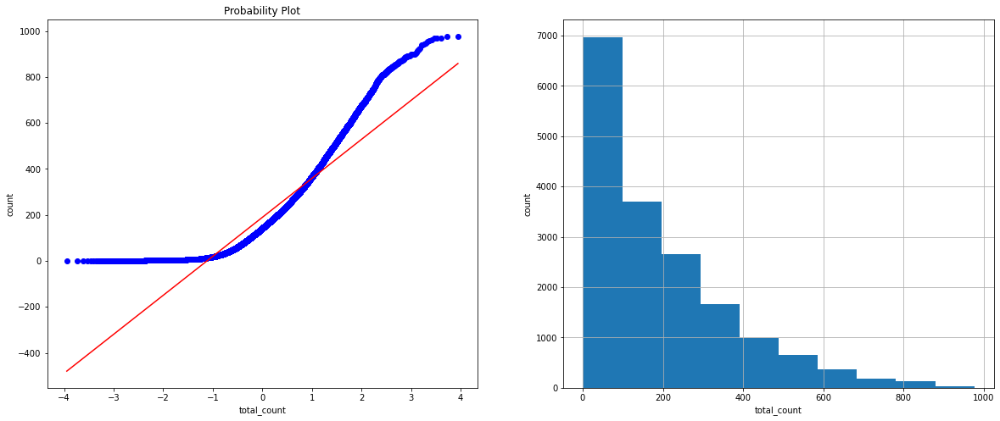

In [20]:
import scipy.stats as stats



for var in df_new.columns:
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    stats.probplot(df[var], dist="norm",plot=plt)
    plt.xlabel(var)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    df[var].hist()
    plt.xlabel(var)
    plt.ylabel('count')
    plt.show()



In [21]:
# df.drop('atemp',axis=1,inplace=True)
df.drop('rec_id',axis=1,inplace=True)

df

,datetime,season,year,month,hour,is_holiday,weekday,is_workingday,weather_condition,temp,atemp,humidity,windspeed,casual,registered,total_count
0,2011-01-01,winter,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2011-01-01,winter,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,2011-01-01,winter,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,2011-01-01,winter,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,2011-01-01,winter,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
5,2011-01-01,winter,0,1,5,0,6,0,2,0.24,0.2576,0.75,0.0896,0,1,1
6,2011-01-01,winter,0,1,6,0,6,0,1,0.22,0.2727,0.80,0.0000,2,0,2
7,2011-01-01,winter,0,1,7,0,6,0,1,0.20,0.2576,0.86,0.0000,1,2,3
8,2011-01-01,winter,0,1,8,0,6,0,1,0.24,0.2879,0.75,0.0000,1,7,8
9,2011-01-01,winter,0,1,9,0,6,0,1,0.32,0.3485,0.76,0.0000,8,6,14


In [22]:
df= pd.get_dummies(df,drop_first=True)

In [23]:
df.head()
# df.shape

,datetime,temp,atemp,humidity,windspeed,casual,registered,total_count,season_spring,season_summer,season_fall,year_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,hour_1,hour_2,hour_3,hour_4,hour_5,hour_6,hour_7,hour_8,hour_9,hour_10,hour_11,hour_12,hour_13,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,is_holiday_1,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,is_workingday_1,weather_condition_2,weather_condition_3,weather_condition_4
0,2011-01-01,0.24,0.2879,0.81,0.0,3,13,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,2011-01-01,0.22,0.2727,0.80,0.0,8,32,40,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,2011-01-01,0.22,0.2727,0.80,0.0,5,27,32,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,2011-01-01,0.24,0.2879,0.75,0.0,3,10,13,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,2011-01-01,0.24,0.2879,0.75,0.0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


<AxesSubplot:>

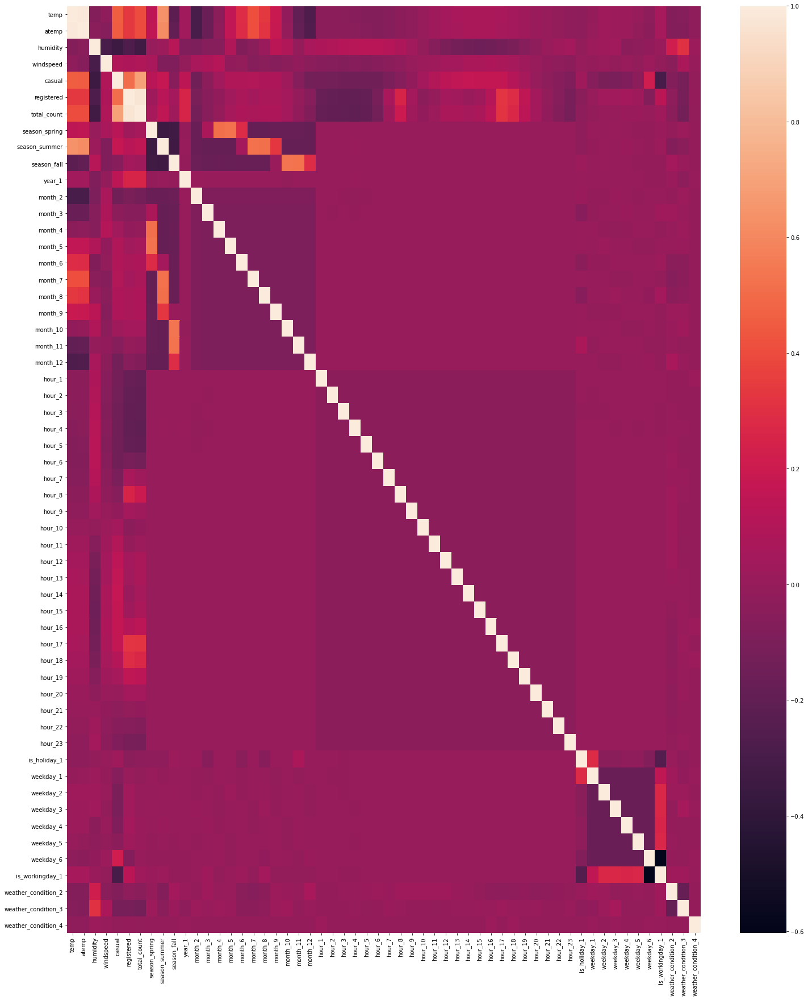

In [24]:
plt.figure(figsize=(25,30))
sns.heatmap(df.corr())

In [30]:
df.columns
X= df.drop('total_count',axis=1)
X=df.drop('datetime',axis=1)
y = df.total_count
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 56 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   temp                 17379 non-null  float64
 1   atemp                17379 non-null  float64
 2   humidity             17379 non-null  float64
 3   windspeed            17379 non-null  float64
 4   casual               17379 non-null  int64  
 5   registered           17379 non-null  int64  
 6   total_count          17379 non-null  int64  
 7   season_spring        17379 non-null  uint8  
 8   season_summer        17379 non-null  uint8  
 9   season_fall          17379 non-null  uint8  
 10  year_1               17379 non-null  uint8  
 11  month_2              17379 non-null  uint8  
 12  month_3              17379 non-null  uint8  
 13  month_4              17379 non-null  uint8  
 14  month_5              17379 non-null  uint8  
 15  month_6              17379 non-null 

In [27]:
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

lr = LinearRegression()

Xtrain,Xtest,ytrain,ytest= train_test_split(X,y,test_size=.2,random_state=2)


In [31]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponentsnew = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponentsnew, columns = ['principal component 1', 'principal component 2'])

In [32]:
(pca.explained_variance_ratio_)  ### 0.99% of variability is explained by 2 components

array([0.96187455, 0.03806039])

In [33]:
principalDf

,principal component 1,principal component 2
0,-225.760319,-3.258580
1,-194.763372,-2.173166
2,-204.431738,-4.299794
3,-229.946363,-2.567017
4,-245.195917,-3.771576
5,-245.195991,-3.772213
6,-244.796594,-1.355207
7,-242.903175,-2.909834
8,-235.926488,-4.062650
9,-231.040870,3.820404


In [34]:
y=df['total_count']
Xtrain,Xtest,ytrain,ytest= train_test_split(principalComponentsnew,y,test_size=.2,random_state=2)


In [35]:
best_model= cross_val_score(lr, Xtrain, ytrain, scoring='r2', cv=5)  ## training set r-squared

In [36]:
best_model.mean()

0.9999999999794429

In [37]:
best_pred = cross_val_score(lr, Xtest, ytest, scoring='r2', cv=5)     ## testing set r-squared
best_pred.mean()

0.9999999999802821